# GFSK Demodulation in Verilog on the DE1-SoC

#### V. Hunter Adams (vha3)

In [9]:
from IPython.display import Latex
import matplotlib.pyplot as plt
%matplotlib inline
import numpy
from numpy import genfromtxt
from mpl_toolkits.mplot3d import Axes3D
from numpy.linalg import pinv
from numpy.linalg import inv
from scipy.stats import norm
from scipy import integrate
from IPython.display import Image
from IPython.core.display import HTML 
from IPython.display import HTML

## Introduction

The objective of this project was to use the DE1-SoC to do realtime filtering, demodulation, decoding, and visualization of radio frequency transmissions from a CC1310 radio chip. A picture of the final setup is shown below.

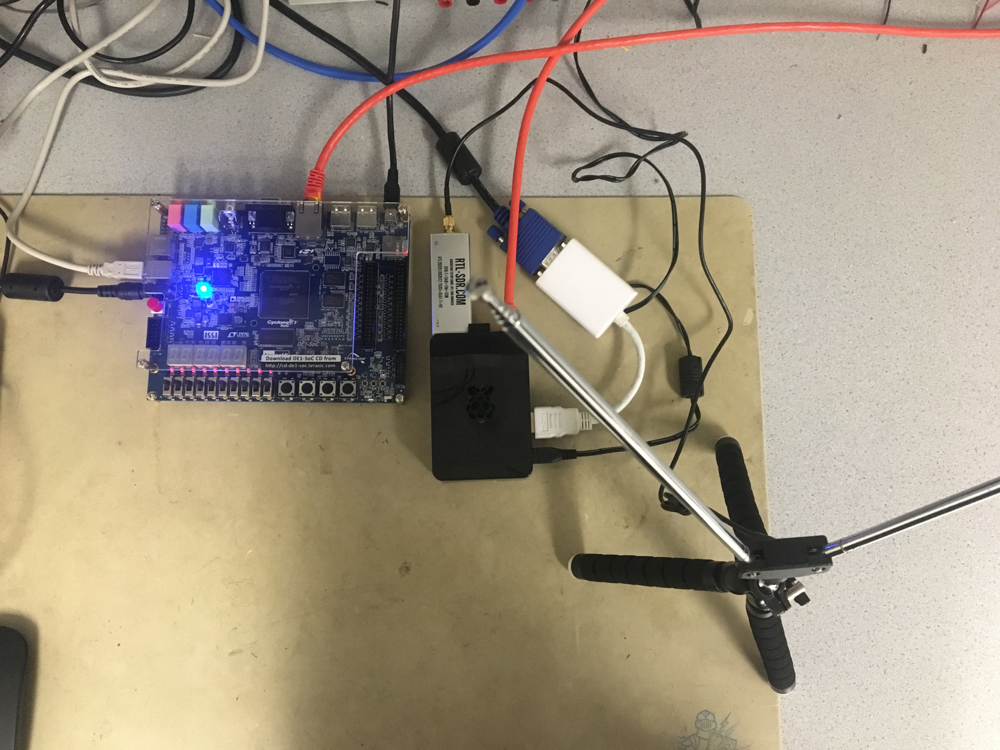

In [6]:
Image(filename = "./setup.png", width=400, height=800)

## High-Level Design

#### Rational and Sources for Idea

My graduate work surrounds the hardware and software design, launch, and operation of very small (5 cm x 5 cm) satellites (see below). Each of these chip-satellites is equipped with a 10 dBm transmitter that, with sufficient signal processing on the ground, can be heard from orbit. For previous missions, we have used a software-defined radio plugged into a laptop and performed all signal processing on the PC. This works well for a handful of chips but, ideally, I would like to be able to visualize data streaming from an entire swarm in realtime using a device that would fit into a backpack. This calls for lots of speed and lots of parallelization, making it a perfect FPGA project.

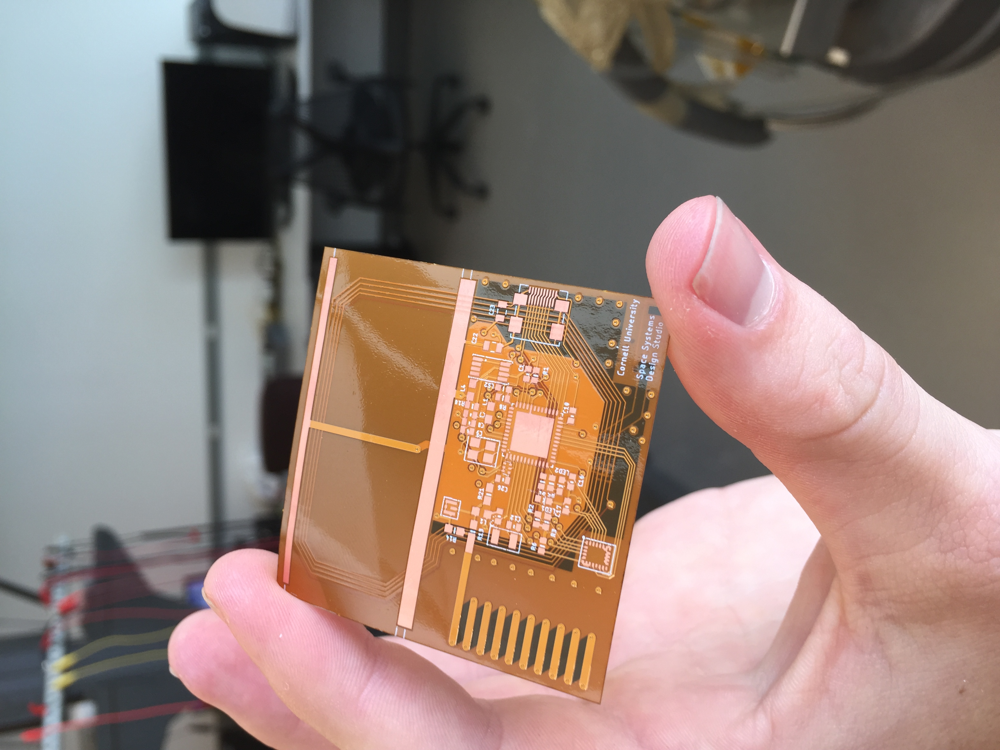

In [8]:
Image(filename = "./monarch.png", width=300, height=800)

#### Background  Math

The RTL-SDR samples at 1 MHz, giving the receiver a bandwidth of 1 MHz (since each sample includes both in-phase and quadrature data). The CC1310 transmitters have a baud rate of 50 bits per second, giving me 20 samples per bit and a transmission bandwidth of 50 kHz. Thus, prior to demodulating the received signals, the FPGA must low-pass the baseband data down to 50 kHz. This is accomplished with a Finite Impulse Response filter.

##### Finite Impulse Response Filter

A finite impulse response filter is essentially just a weighted average of the $N$ most recent samples, where the weights associated with each of those samples are chosen in order to get a desired frequency response in the filter. For example, the output $y[n]$ of an FIR filter of order $N$ is shown below, where $b_i$ is the weight associated with sample $x_i$.

\begin{align}
y[n] &= \sum_{i=0}^N b_0x[n] + b_1x[n-1] + \cdots + b_N x[n-N]
\end{align}

This filters have the advantage of requiring no feedback, being inherently stable, and being capable of being designed such that they are linear phase. This is accomplished by simply making the coefficient sequence symmetric, and is a desirable property for phase-sensitive applications like GFSK demodulation.

Many methods exist for coming up with a set of coefficients that meet requirements on passband ripple, stopband ripple, and transition width. Some of these include the window design method, frequency sampling method, and Parks-McClellan method. I used a Matlab tool that implements the Parks-McClellan method in order to come up with a set of coefficents for a 10-tap FIR filter that low-passes the raw RF samples down to 50 kHz. Such tools did not exist for any of the other aspects of this project.

##### GFSK Demodulation

The low-power transmitters (TI-CC1310's) use Gaussian Frequency Shift Keying (GFSK) to encode information at the carrier frequency. With GFSK, a logical 1 is encoded by increasing the frequency of the transmission to slightly greater than the carrier frequency and a logical zero is encoded by decreasing the frequency of the transmission to slightly less than the carrier frequency. This is in contrast to Amplitude Modulation which obviously modulates the amplitude in order to encode 1's and 0's, and Phase Modulation, which modulates the phase of the transmission (while keeping the frequency constant) in order to encode 1's and 0's. A good introductory article on these modulation schemes can be found here: https://www.allaboutcircuits.com/textbook/radio-frequency-analysis-design/radio-frequency-demodulation/quadrature-frequency-and-phase-demodulation/.

A discussion of the demodulation method requires a brief discussion of how the RTL-SDR sampling works. The RTL-SDR has two voltage-controlled oscillators that oscillate at precisely the carrier frequency of the transmitter (915 MHz). One of these oscillators is 90 degrees out of phase from the other. The RF transmissions received by the antenna are mixed with these local oscillators in order to get the baseband transmission. By mixing the received transmissions with both the in-phase oscillator and the out-of-phase oscillator, the RTL-SDR is able to represent the received transmission as the sum of two out-of-phase 915 MHz waves. One of these waves is in-phase (I) and the other is out-of-phase (or "quadrature", Q). This I/Q data is a nice way to represent the received transmissions because it is independent of the carrier frequency, and it includes phase information (which would be impossible to recover with just one local oscillator).

With the I/Q data, one has all of the information necessary to demodulate any of the modulation schemes mentioned above. For Amplitude Modulation, the relevant quantity would be the amplitude of the received transmission ($\sqrt{I^2 + Q^2}$). For phase modulation, the relevant quantity is the phase of the received signal relative to the local oscillators $\left(\text{atan2}\left(\frac{I}{Q}\right)\right)$. For Frequency Modulation, the information is encoded on the derivative of the phase. A procedural way to approximate this quantity is to find the conjugate product of the $n^{th}$ and $(n-1)^{st}$ samples (a complex number), and then to find the argument of the resulting complex number. If these two samples have the same phase, then the product will be a real number with argument 0. If these two samples are 90 degrees out of phase, then the product will be a purely imaginary number with argument $\frac{\pi}{2}$. The I/Q plot for a frequency-modulated signal ends up forming a circle, since the phase of the received transmission moves continually around the complex plane. For phase-modulated signals, the I/Q plots look like a collection of dots. Letting $\tilde{x}[n-1]$ be the complex conjugate of sample $x[n-1]$, this is represented by the below equation.

\begin{align}
y[n] = \text{arg}\left(x[n]\overline{x}[n-1]\right)
\end{align}

When no transmission is being received, the output of this demodulation method is white noise, since two consecutive samples may be any amount of phase separated from one another. During a transmission, however, this demodulation method is capable of recovering the logical waveform (the 1's and 0's) of the transmission. Below, the red trace is the output of the GFSK demodulation during a transmission. The logical 1's and 0's, clearly visible in the red trace, are represented by the blue binary-slicer below the red trace. In the upper-right corner, I have plotted the raw I and Q data (I on the horizontal, Q on the vertical). You can see that, during the transmission, this data forms a circle.

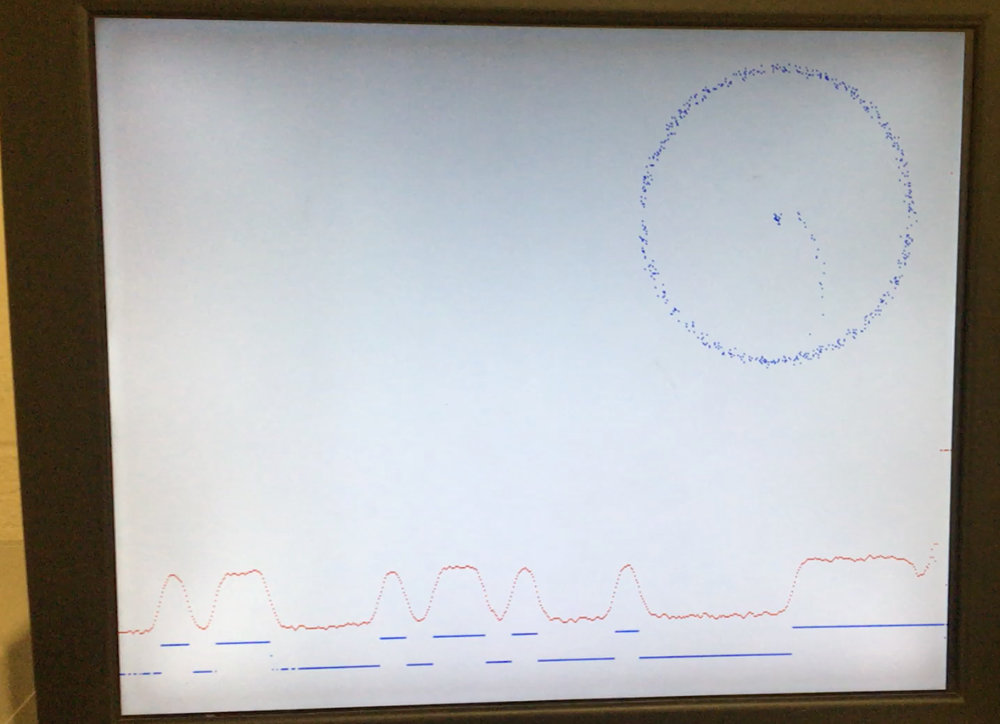

In [6]:
Image(filename = PATH + "iq.png", width=800, height=800)

#### Hardware/Software Tradeoffs

As with most of the previous projects, the biggest tradeoff that I had to consider between hardware and software was speed and parallelization vs. resource utilization. Anything that needed to happen quickly in order to keep up with the software defined radio had to happen on the FPGA, and anything else could be relegated to the HPS. For this particular application, the HPS was responsible for ferrying data from the software-defined radio to the FPGA over a FIFO, and the FPGA was responsible for all signal processing (including filtering, demodulation, and eventually decoding) and visualization.

One of the biggest tradeoffs lay in the FIR filter. The more taps that I include in this filter, the cleaner the output. However, each additional tap also requires an additional multiplier. I had to strike a balance between performance and resource utilization. In the end, I chose a 10-tap filter. I am fortunate, however, that the parallelization required for Code Division Multiple Access and Low-Density Parity Check encoding operates on the binary bitstream that is output from the GFSK demodulator/binary slicer and not on the raw RF itself. Thus, the "multiplies" associated with CDMA and LDPC will be representable as adds. I haven't gotten this far yet, however, since for now I am still only receiving and visualizing signals from one transmitter.

#### Relationship between design and available standards

To the extent that GFSK modulation is a standard, my hardware design is compatible with that standard. This method for modulation is general enough that, if I tune my receiver to an FM radio station, I can recover the logical bitstream associated with their transmissions also.

The other standard compatibility that I have is with TCP/IP. As is described in a later section, the software-defined radio dongle interfaces with a Raspberry Pi, which communicates I/Q samples to the HPS over a TCP/IP socket. The software that controls that interaction is compatible with TCP/IP standards to the extent that, if I setup port forwarding, I could place the Raspberry Pi and radio dongle in the field plugged into an ethernet port and keep the FPGA in mission control. I intentionally designed the system this way because I would like for the deployed hardware to be as cheap as possible.

#### Relevant patents, copyrights, and trademarks

With the exception of the De1-SoC, every hardware component that I used is open-sourced (Raspberry Pi and RTL-SDR). There are no copyrights or trademarks on any of the techniques that I employed.

The only copyrighted material that I've used is the Altera IP. I used the ALTERA_CORDIC IP in order to take the atan2 required for GFSK demodulation.

## Program/Hardware Design

#### Parts that were tricky

I kept note of the particularly tricky tasks as I worked through this project. Here they are, in chronological order.

*Ethernet*: As discussed in the proceeding section, I used a Raspberry Pi to get data off of the RTL-SDR, and then communicated that data to the HPS through a TCP/IP socket. This is not "hard" in the sense that it is novel, but it was hard because I personally had never used ethernet for communication. In the appendices, I've included a step-by-step guide for setting up this communication channel between the RPi and the HPS.

*FIFO Bottleneck*: The RTL-SDR is capable of sampling at rates between 300 ksps and 3 Msps. For a few days, I was unable to use a FIFO to communicate these samples from the HPS to the FPGA any faster than 300 ksps without losing samples. I traced the bottleneck to a macro on the HPS that checked whether the FIFO was full before writing to it. Although a good idea, this check slowed down the channel considerably. I instead eliminated the FIFO check and trusted that the FPGA would keep up as samples were being written. To make sure that this was indeed the case, I had the HPS iterate a counter each time it wrote a sample to the FIFO. The FPGA iterated a second counter each time it grabbed a sample from the FIFO and displayed the result on the hex output display. I could verify that the FPGA was keeping up by making sure that the two counters stayed in sync.

*Overflow*: GFSK demodulation requires taking the conjugate product of two complex numbers, and then finding the argument of the resulting complex number. Because the samples are represented in fixed-point, I needed to be careful of overflow during intermediate steps of the demodulation. This isn't particularly mysterious, but I'm including it because it took me a few days to track down.

*Display Trigger*: The logical waveforms are displayed as on an oscilloscope. Triggering the display was a tricky task because the noise associated with no signal can also easily trigger most naive methods (such as threshold crossing). Instead, the FPGA checked for a cluster of demodulated samples in very near proximity to one another (as is the case for a signal, and is rarely the case for noise), and triggered a new display when such a cluster was found. This seemed to work very well.

#### Parts that were NOT tricky

I wanted to add this section because I expected to spend at least half of a week implementing an atan2. However, the Altera IP for doing this is extremely easy to use and is relatively well documented (in contrast to some of the other modules). I recommend it entirely, it took me less than 30 minutes to have something running.

#### Hardware Details

The hardware is summarized by the illustration below. A CC1310 transmits a GFSK-modulated packet at 915 MHz. This transmission is picked up by a folded dipole antenna connected via SMA to the RTL-SDR. The software-defined radio is configured to sample at 1 MHz, and these samples are communicated over a USB connection to a Raspberry Pi 3.0. The Raspberry Pi uses rtl_tcp (an open-source software package) to send these packets over a TCP/IP socket. The ARM opens a socket and listens for packets from the Raspberry Pi. A state machine on the Raspberry Pi listens for packets and, upon receipt of a packet, puts that packet into a FIFO accessible by the FPGA. When a packet is available in the FIFO, a state machine on the FPGA grabs that packet, filters it, demodulates it, and writes relevant pixels to the VGA SRAM.

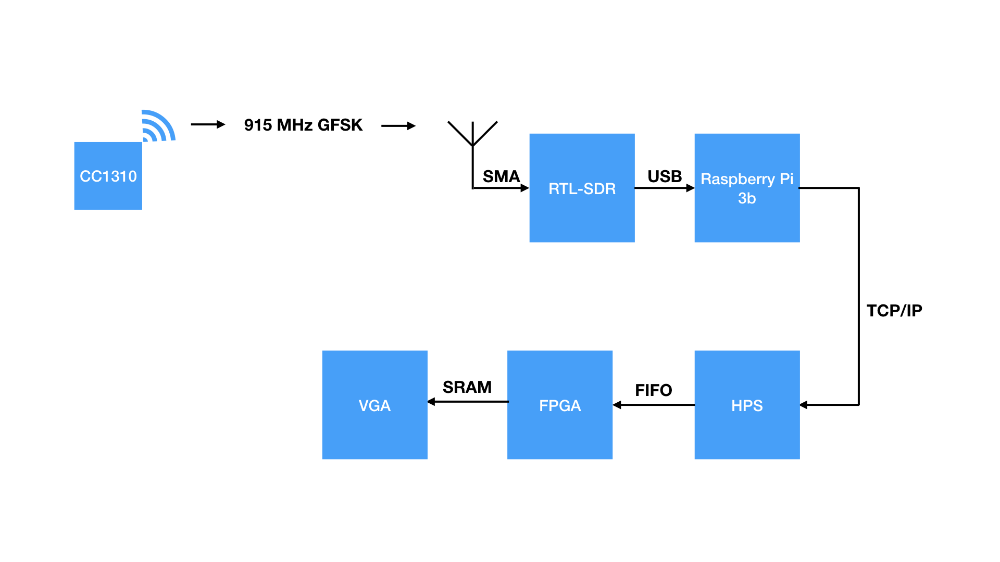

In [8]:
Image(filename = PATH + "hardware.png", width=800, height=800)

#### Software Details

There is software running on the Raspberry Pi and HPS, and verilog associated with the FPGA. I will discuss each separately.

*Raspberry Pi*

The Raspberry Pi's only job is to gather data off of the RTL-SDR and send it over a TCP/IP socket to the HPS. All of this is accomplished using rtl_tcp, an open-sourced software package for interfacing with these radio dongles. I did not write any software for the Raspberry Pi, I instead learned the API for rtl_tcp and used that.

*HPS*

There is a very simple state machine running on the HPS. One state listens for TCP/IP packets from the RPi and fills a buffer with any received data. When data is detected in the buffer, the HPS moves to the second state.

The second state simply writes all of the data in the buffer to the FIFO connected to the FPGA, and then sends the system back to the first state to listen for more data.

*Verilog*

The FPGA runs a more complex state machine. The FPGA sits in an idle state waiting for new data. When data is detected in the FIFO, it puts it into one of two buffers. One buffer contains in-phase samples, the other contains quadrature samples. These buffers are wired to modules that low-pass filter them, and the output of the low pass filters are wired to modules that find the conjugate product of each sample with the previous sample. Finally, the output of that conjugate product module is wired to the ALTERA_CORDIC module which finds the argument of the resulting complex number. This angle is where the 1's and 0's are actually encoded. All of this happens between two states.

In the next state (after all of the filtering and demodulating has taken place), the FPGA enters the draw state in which it displays the logical waveform and raw I/Q samples on the VGA display. The FPGA then returns to the idle state where it awaits more data.

#### Borrowed Code

The VGA code is based on Bruce's GPU with FAST SRAM example on the 5760 website. My FIR filter and the foundation for the HPS to FPGA FIFO also come from examples by Bruce. The software running on the Raspberry Pi is RTL_TCP, an open-sourced package for interfacing with the radio dongle.

I used Altera IP for the atan2 associated with GFSK demodulation.

#### Dead-Ends

I tried to use Altera IP for performing an FFT and implementing an FIR filter. In the end, poor documentation made both of these impracticle to use.

## Results

#### Test Data and Traces

In the demo video below, the red CC1310 breakout board is transmitting at 915 MHz GFSK. A dipole antenna across the room is receiving those transmissions, which are being mixed to baseband and sampled a 1MHz by the RTL-SDR. These samples are communicated over USB to a Raspberry Pi, which sends them over ethernet to the HPS. The HPS communicates those packets over a FIFO to the FPGA, which filters, demodulates, and displays the logical waveforms.

<iframe width="560" height="315" src="https://www.youtube.com/embed/xWDYJcOtmeg" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>

#### Speed of Execution

The fundamental deadline for this system is that all signal processing for a particular packet be finished before the next packet arrives. Because I am only sampling at 1 MHz, I can have the state machine run at a leisurely 50 MHz without any problem at all.

#### Accuracy

For the close-proximity transmissions that I performed during lab, the FPGA was capable of perfectly recovering every transmitted packet. Of course, as the distance increases and the number of transmitters increases, the packet loss will undoubtably increase. When the receiver is in a more complete/mobile state, I will perform a number of range and swarm tests to characterize bit error rate.

#### Interference with Other Designs

Because this device is strictly a receiver (and not a transmitter), it does not interfere with other wireless devices. Instead, it itself could be adversely affected by nearby ISM-band transmitters.

#### Usability

For the moment, the user interface is not particularly intuitive. All of the RTL-SDR settings are configured on the Raspberry Pi, though an API exists for configuring these settings via TCP/IP commands, so future work will involve developing an interface for changing the SDR settings from the HPS.

The LED and HEX outputs display the number of bytes received by the FPGA, and the switches control a few different gain settings and decimation. Switches 0-2 control sample decimation, switches 5-3 control intermediate frequency gain, and switches 8-6 control demodulation gain. Ultimately, I want for all of these to be controlled by an on-screen user interface.

## Appendices

### Code Listing

##### HPS

```c
///////////////////////////////////////
/// 640x480 version!
/// test VGA with hardware video input copy to VGA
// compile with
// gcc fp_test_1.c -o fp1 -lm
///////////////////////////////////////
// needed for CPU_SET, which is needed to
// force threads onto one processor
#define _GNU_SOURCE 

#include <stdio.h>
#include <string.h>
#include <stdlib.h>
#include <unistd.h>
#include <fcntl.h>
#include <sys/types.h>
#include <sys/ipc.h> 
#include <sys/shm.h> 
#include <sys/mman.h>
#include <sys/time.h> 
#include <math.h> 
#include <sys/socket.h>
#include <netinet/in.h>
#include <netdb.h> 
#include <sched.h>

// threads
#include <pthread.h>
#include <semaphore.h>

#include "address_map_arm_brl4.h"

// main bus; FIFO write address
#define FIFO_BASE            0xC0000000
//#define FIFO_SPAN            0x00001000
#define FIFO_SPAN            0x01000000
// the read and write ports for the FIFOs
// you need to query the status ports before these operations
// PUSH the write FIFO
// POP the read FIFO
#define FIFO_WRITE		     (*(FIFO_write_ptr))
#define FIFO_READ            (*(FIFO_read_ptr))

/// lw_bus; FIFO status address
#define HW_REGS_BASE          0xff200000
#define HW_REGS_SPAN          0x00005000 
// WAIT looks nicer than just braces
#define WAIT {}
// FIFO status registers
// base address is current fifo fill-level
// base+1 address is status: 
// --bit0 signals "full"
// --bit1 signals "empty"
#define WRITE_FIFO_FILL_LEVEL (*FIFO_write_status_ptr)
#define READ_FIFO_FILL_LEVEL  (*FIFO_read_status_ptr)
#define WRITE_FIFO_FULL		  ((*(FIFO_write_status_ptr+1))& 1 ) 
#define WRITE_FIFO_EMPTY	  ((*(FIFO_write_status_ptr+1))& 2 ) 
#define READ_FIFO_FULL		  ((*(FIFO_read_status_ptr+1)) & 1 )
#define READ_FIFO_EMPTY	      ((*(FIFO_read_status_ptr+1)) & 2 ) 

// arg a is data to be written
#define FIFO_WRITE_BLOCK(a)	  {while (WRITE_FIFO_FULL){WAIT};FIFO_WRITE=a;}
// arg a is data to be written, arg b is success/fail of write: b==1 means success
#define FIFO_WRITE_NOBLOCK(a,b) {b=!WRITE_FIFO_FULL; if(!WRITE_FIFO_FULL)FIFO_WRITE=a; }
// arg a is data read
#define FIFO_READ_BLOCK(a)	  {while (READ_FIFO_EMPTY){WAIT};a=FIFO_READ;}
// arg a is data read, arg b is success/fail of read: b==1 means success
#define FIFO_READ_NOBLOCK(a,b) {b=!READ_FIFO_EMPTY; if(!READ_FIFO_EMPTY)a=FIFO_READ;}


/* function prototypes */
void VGA_text (int, int, char *);
void VGA_text_clear();
void VGA_box (int, int, int, int, short);
void VGA_line(int, int, int, int, short) ;
void VGA_disc (int, int, int, short);
int  VGA_read_pixel(int, int) ;
int  video_in_read_pixel(int, int);
void draw_delay(void) ;

// the light weight buss base
void *h2p_lw_virtual_base;
// HPS_to_FPGA FIFO status address = 0
volatile unsigned int * FIFO_write_status_ptr = NULL ;
volatile unsigned int * FIFO_read_status_ptr = NULL ;

// RAM FPGA command buffer
volatile unsigned int * sram_ptr = NULL ;
void *sram_virtual_base;

// HPS_to_FPGA FIFO write address
// main bus addess 0x0000_0000
void *h2p_virtual_base;
volatile unsigned int * FIFO_write_ptr = NULL ;
volatile unsigned int * FIFO_read_ptr = NULL ;

// pixel buffer
volatile unsigned int * vga_pixel_ptr = NULL ;
void *vga_pixel_virtual_base;

// character buffer
volatile unsigned int * vga_char_ptr = NULL ;
void *vga_char_virtual_base;

// /dev/mem file id
int fd;

// pixel macro
// !!!PACKED VGA MEMORY!!!
#define VGA_PIXEL(x,y,color) do{\
	char  *pixel_ptr ;\
	pixel_ptr = (char *)vga_pixel_ptr + ((y)*640) + (x) ;\
	*(char *)pixel_ptr = (color);\
} while(0)
	

// measure time
// struct timeval t1, t2;
// double elapsedTime;
// struct timespec delay_time ;

sem_t tcpip_semaphore;
sem_t write_semaphore;

unsigned char buffer[512];
//int count = -1;
//int num_sends = 0;

void * read_tcpip() {

	int sockfd, portno, n;
    struct sockaddr_in serv_addr;
    struct hostent *server;
    char frequency;
    unsigned int length;

    portno = atoi("1234");
    sockfd = socket(AF_INET, SOCK_STREAM, 0);
    if (sockfd < 0) 
        error("ERROR opening socket");
    server = gethostbyname("169.254.219.73");
    if (server == NULL) {
        fprintf(stderr,"ERROR, no such host\n");
        exit(0);
    }
    bzero((char *) &serv_addr, sizeof(serv_addr));
    serv_addr.sin_family = AF_INET;
    bcopy((char *)server->h_addr, 
         (char *)&serv_addr.sin_addr.s_addr,
         server->h_length);
    serv_addr.sin_port = htons(portno);
    if (connect(sockfd,(struct sockaddr *) &serv_addr,sizeof(serv_addr)) < 0) 
        error("ERROR connecting");
    //printf("Please enter the message: ");
    bzero(buffer,512);
    length=sizeof(struct sockaddr_in);

    int i ;
	int stop = 0;

	while (!READ_FIFO_EMPTY) {
				printf("%x", FIFO_READ) ;
			}
	printf("\nFinished Cleaning\n");
	unsigned char junk;
	

	
	while(1) 
	{
		// while (count < 100000){
		
		n = recvfrom(sockfd, buffer,
            512, 0,(struct sockaddr *)&serv_addr, &length);
		
		if (n > 0) {
			// if (count % 1000 == 0) {
			// 	printf("\n%d\n",count);
			// 	printf("%d\n",WRITE_FIFO_FULL);
			// }
			sem_wait(&tcpip_semaphore);
			sem_post(&write_semaphore);
			
			n = 0;
			//count++;
		}
		// }
		// close(sockfd);
		// if (stop == 0){
		// 	printf("%06x\n", num_sends);
		// 	stop += 1;
		// }
	} // end while(1)

}

void * write_fpga() {
	int j;
	unsigned char junk;
	int test;

	while (1) {
		sem_wait(&write_semaphore);
		for (j=0; j < (sizeof buffer); j++){
			//FIFO_WRITE_BLOCK(buffer[j]);
			/* NOTE!! It's CHECKING THE FIFO that is causing delays */
			FIFO_WRITE = buffer[j];
			//num_sends += 1;
			// while (!READ_FIFO_EMPTY) {	
			// 	//junk = FIFO_READ;
			// 	if (count % 1000 == 0) {
			// 		test = FIFO_READ;
			// 		printf("%d ", test);
			// 	}
			// 	else {
			// 		junk = FIFO_READ;
			// 	}
			// }
		}
		//bzero(buffer, 512);
		sem_post(&tcpip_semaphore);
	}
}
	
int main(void)
{
	// delay_time.tv_nsec = 10 ;
	// delay_time.tv_sec = 0 ;

	// Declare volatile pointers to I/O registers (volatile 	// means that IO load and store instructions will be used 	// to access these pointer locations, 
	// instead of regular memory loads and stores) 
  	
	// === need to mmap: =======================
	// FPGA_CHAR_BASE
	// FPGA_ONCHIP_BASE      
	// HW_REGS_BASE        
  
	// === get FPGA addresses ==================
    // Open /dev/mem
	if( ( fd = open( "/dev/mem", ( O_RDWR | O_SYNC ) ) ) == -1 ) 	{
		printf( "ERROR: could not open \"/dev/mem\"...\n" );
		return( 1 );
	}
    
    // get virtual addr that maps to physical
	// for light weight bus
	h2p_lw_virtual_base = mmap( NULL, HW_REGS_SPAN, ( PROT_READ | PROT_WRITE ), MAP_SHARED, fd, HW_REGS_BASE );	
	if( h2p_lw_virtual_base == MAP_FAILED ) {
		printf( "ERROR: mmap1() failed...\n" );
		close( fd );
		return(1);
	}

	// the two status registers
	FIFO_write_status_ptr = (unsigned int *)(h2p_lw_virtual_base);
	// From Qsys, second FIFO is 0x20
	FIFO_read_status_ptr = (unsigned int *)(h2p_lw_virtual_base + 0x20); //0x20
	
	// === get VGA char addr =====================
	// get virtual addr that maps to physical
	vga_char_virtual_base = mmap( NULL, FPGA_CHAR_SPAN, ( PROT_READ | PROT_WRITE ), MAP_SHARED, fd, FPGA_CHAR_BASE );	
	if( vga_char_virtual_base == MAP_FAILED ) {
		printf( "ERROR: mmap2() failed...\n" );
		close( fd );
		return(1);
	}
    
    // Get the address that maps to the character 
	vga_char_ptr =(unsigned int *)(vga_char_virtual_base);

	// === get VGA pixel addr ====================
	// get virtual addr that maps to physical
	// SDRAM
	vga_pixel_virtual_base = mmap( NULL, FPGA_ONCHIP_SPAN, ( PROT_READ | PROT_WRITE ), MAP_SHARED, fd, SDRAM_BASE); //SDRAM_BASE	
	
	if( vga_pixel_virtual_base == MAP_FAILED ) {
		printf( "ERROR: mmap3() failed...\n" );
		close( fd );
		return(1);
	}
    // Get the address that maps to the FPGA pixel buffer
	vga_pixel_ptr =(unsigned int *)(vga_pixel_virtual_base);
	
	// === get RAM FPGA parameter addr =========
	sram_virtual_base = mmap( NULL, FPGA_ONCHIP_SPAN, ( PROT_READ | PROT_WRITE ), MAP_SHARED, fd, FPGA_ONCHIP_BASE); //fp	
	
	if( sram_virtual_base == MAP_FAILED ) {
		printf( "ERROR: mmap3() failed...\n" );
		close( fd );
		return(1);
	}
    // Get the address that maps to the RAM buffer
	sram_ptr =(unsigned int *)(sram_virtual_base);

	// FIFO write addr 
	h2p_virtual_base = mmap( NULL, FIFO_SPAN, ( PROT_READ | PROT_WRITE ), MAP_SHARED, fd, FIFO_BASE); 	
	
	if( h2p_virtual_base == MAP_FAILED ) {
		printf( "ERROR: mmap3() failed...\n" );
		close( fd );
		return(1);
	}
    // Get the address that maps to the FIFO read/write ports
	FIFO_write_ptr =(unsigned int *)(h2p_virtual_base + 0x500000);
	FIFO_read_ptr = (unsigned int *)(h2p_virtual_base + 0x500010); //0x10
	
	// ===========================================

	/* create a message to be displayed on the VGA 
          and LCD displays */
	char text_top_row[40] = "DE1-SoC ARM/FPGA\0";
	char text_bottom_row[40] = "Monarch Receiver\0";
	char my_name[40] = "V. Hunter Adams\0";
	char num_string[20], time_string[50] ;
	
	// a pixel from the video
	int pixel_color;
	// video input index
	int i,j, count;
	
	// clear the screen
	VGA_box (0, 0, 639, 479, 0xffff);
	// clear the text
	VGA_text_clear();
	VGA_text (1, 56, text_top_row);
	VGA_text (1, 57, text_bottom_row);
	VGA_text (1, 58, my_name);

	VGA_line(320, 10, 320, 470, 0xFF);
	VGA_line(10, 240, 630, 240, 0xFF);
	
	cpu_set_t cpuset;
	CPU_ZERO(&cpuset);  
	// put two processsors into the list
	CPU_SET(0, &cpuset);
	CPU_SET(1, &cpuset);
	
	// the thread identifiers
	pthread_t thread_read, thread_write ;
	
	// the semaphore inits
	// tcpip is not ready becuase nothing has been input yet
	sem_init(&tcpip_semaphore, 0, 1);
	// write is ready at init time
	sem_init(&write_semaphore, 0, 0); 
	
	//For portability, explicitly create threads in a joinable state 
	// thread attribute used here to allow JOIN
	pthread_attr_t attr;
	pthread_attr_init(&attr);
	pthread_attr_setdetachstate(&attr, PTHREAD_CREATE_JOINABLE);
	
	// now the threads
	pthread_create(&thread_read,NULL,read_tcpip,NULL);
	pthread_create(&thread_write,NULL,write_fpga,NULL);
	
	// for efficiency, force  threads onto separate processors
	pthread_setaffinity_np(thread_read, sizeof(cpu_set_t), &cpuset);
	pthread_setaffinity_np(thread_write, sizeof(cpu_set_t), &cpuset);
	
	// In this case the thread never exit
	pthread_join(thread_read,NULL);
	pthread_join(thread_write,NULL);
	return 0;
} // end main

/****************************************************************************************
 * Subroutine to read a pixel from the video input 
****************************************************************************************/
// int  video_in_read_pixel(int x, int y){
	// char  *pixel_ptr ;
	// pixel_ptr = (char *)video_in_ptr + ((y)<<9) + (x) ;
	// return *pixel_ptr ;
// }

/****************************************************************************************
 * Subroutine to read a pixel from the VGA monitor 
****************************************************************************************/
int  VGA_read_pixel(int x, int y){
	char  *pixel_ptr ;
	pixel_ptr = (char *)vga_pixel_ptr + ((y)*640) + (x) ;
	return *pixel_ptr ;
}

/****************************************************************************************
 * Subroutine to send a string of text to the VGA monitor 
****************************************************************************************/
void VGA_text(int x, int y, char * text_ptr)
{
  	volatile char * character_buffer = (char *) vga_char_ptr ;	// VGA character buffer
	int offset;
	/* assume that the text string fits on one line */
	offset = (y << 7) + x;
	while ( *(text_ptr) )
	{
		// write to the character buffer
		*(character_buffer + offset) = *(text_ptr);	
		++text_ptr;
		++offset;
	}
}

/****************************************************************************************
 * Subroutine to clear text to the VGA monitor 
****************************************************************************************/
void VGA_text_clear()
{
  	volatile char * character_buffer = (char *) vga_char_ptr ;	// VGA character buffer
	int offset, x, y;
	for (x=0; x<79; x++){
		for (y=0; y<59; y++){
	/* assume that the text string fits on one line */
			offset = (y << 7) + x;
			// write to the character buffer
			*(character_buffer + offset) = ' ';		
		}
	}
}

/****************************************************************************************
 * Draw a filled rectangle on the VGA monitor 
****************************************************************************************/
#define SWAP(X,Y) do{int temp=X; X=Y; Y=temp;}while(0) 

void VGA_box(int x1, int y1, int x2, int y2, short pixel_color)
{
	char  *pixel_ptr ; 
	int row, col;

	/* check and fix box coordinates to be valid */
	if (x1>639) x1 = 639;
	if (y1>479) y1 = 479;
	if (x2>639) x2 = 639;
	if (y2>479) y2 = 479;
	if (x1<0) x1 = 0;
	if (y1<0) y1 = 0;
	if (x2<0) x2 = 0;
	if (y2<0) y2 = 0;
	if (x1>x2) SWAP(x1,x2);
	if (y1>y2) SWAP(y1,y2);
	for (row = y1; row <= y2; row++)
		for (col = x1; col <= x2; ++col)
		{
			//640x480
			VGA_PIXEL(col, row, pixel_color);
			//pixel_ptr = (char *)vga_pixel_ptr + (row<<10)    + col ;
			// set pixel color
			//*(char *)pixel_ptr = pixel_color;		
		}
}

/****************************************************************************************
 * Draw a filled circle on the VGA monitor 
****************************************************************************************/

void VGA_disc(int x, int y, int r, short pixel_color)
{
	char  *pixel_ptr ; 
	int row, col, rsqr, xc, yc;
	
	rsqr = r*r;
	
	for (yc = -r; yc <= r; yc++)
		for (xc = -r; xc <= r; xc++)
		{
			col = xc;
			row = yc;
			// add the r to make the edge smoother
			if(col*col+row*row <= rsqr+r){
				col += x; // add the center point
				row += y; // add the center point
				//check for valid 640x480
				if (col>639) col = 639;
				if (row>479) row = 479;
				if (col<0) col = 0;
				if (row<0) row = 0;
				VGA_PIXEL(col, row, pixel_color);
				//pixel_ptr = (char *)vga_pixel_ptr + (row<<10) + col ;
				// set pixel color
				//nanosleep(&delay_time, NULL);
				//draw_delay();
				//*(char *)pixel_ptr = pixel_color;
			}
					
		}
}

// =============================================
// === Draw a line
// =============================================
//plot a line 
//at x1,y1 to x2,y2 with color 
//Code is from David Rodgers,
//"Procedural Elements of Computer Graphics",1985
void VGA_line(int x1, int y1, int x2, int y2, short c) {
	int e;
	signed int dx,dy,j, temp;
	signed int s1,s2, xchange;
     signed int x,y;
	char *pixel_ptr ;
	
	/* check and fix line coordinates to be valid */
	if (x1>639) x1 = 639;
	if (y1>479) y1 = 479;
	if (x2>639) x2 = 639;
	if (y2>479) y2 = 479;
	if (x1<0) x1 = 0;
	if (y1<0) y1 = 0;
	if (x2<0) x2 = 0;
	if (y2<0) y2 = 0;
        
	x = x1;
	y = y1;
	
	//take absolute value
	if (x2 < x1) {
		dx = x1 - x2;
		s1 = -1;
	}

	else if (x2 == x1) {
		dx = 0;
		s1 = 0;
	}

	else {
		dx = x2 - x1;
		s1 = 1;
	}

	if (y2 < y1) {
		dy = y1 - y2;
		s2 = -1;
	}

	else if (y2 == y1) {
		dy = 0;
		s2 = 0;
	}

	else {
		dy = y2 - y1;
		s2 = 1;
	}

	xchange = 0;   

	if (dy>dx) {
		temp = dx;
		dx = dy;
		dy = temp;
		xchange = 1;
	} 

	e = ((int)dy<<1) - dx;  
	 
	for (j=0; j<=dx; j++) {
		//video_pt(x,y,c); //640x480
		VGA_PIXEL(x, y, c);
		//pixel_ptr = (char *)vga_pixel_ptr + (y<<10)+ x; 
		// set pixel color
		//*(char *)pixel_ptr = c;	
		 
		if (e>=0) {
			if (xchange==1) x = x + s1;
			else y = y + s2;
			e = e - ((int)dx<<1);
		}

		if (xchange==1) y = y + s2;
		else x = x + s1;

		e = e + ((int)dy<<1);
	}
}

/////////////////////////////////////////////

#define NOP10() asm("nop;nop;nop;nop;nop;nop;nop;nop;nop;nop")

void draw_delay(void){
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10(); //16
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10(); //32
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10(); //48
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10(); //64
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10();
	NOP10(); NOP10(); NOP10(); NOP10(); //68
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10(); //80
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10();
	// NOP10(); NOP10(); NOP10(); NOP10(); //96
}

/// /// ///////////////////////////////////// 
/// end /////////////////////////////////////
```

##### FPGA

```c


module DE1_SoC_Computer (
	////////////////////////////////////
	// FPGA Pins
	////////////////////////////////////

	// Clock pins
	CLOCK_50,
	CLOCK2_50,
	CLOCK3_50,
	CLOCK4_50,
	
	// ADC
	ADC_CS_N,
	ADC_DIN,
	ADC_DOUT,
	ADC_SCLK,
	
	
	// Audio
	AUD_ADCDAT,
	AUD_ADCLRCK,
	AUD_BCLK,
	AUD_DACDAT,
	AUD_DACLRCK,
	AUD_XCK,
	
	// SDRAM
	DRAM_ADDR,
	DRAM_BA,
	DRAM_CAS_N,
	DRAM_CKE,
	DRAM_CLK,
	DRAM_CS_N,
	DRAM_DQ,
	DRAM_LDQM,
	DRAM_RAS_N,
	DRAM_UDQM,
	DRAM_WE_N,

	// I2C Bus for Configuration of the Audio and Video-In Chips
	FPGA_I2C_SCLK,
	FPGA_I2C_SDAT,

	// 40-Pin Headers
	GPIO_0,
	GPIO_1,
	
	// Seven Segment Displays
	HEX0,
	HEX1,
	HEX2,
	HEX3,
	HEX4,
	HEX5,

	
	// IR
	IRDA_RXD,
	IRDA_TXD,

	// Pushbuttons
	KEY,

	// LEDs
	LEDR,

	// PS2 Ports
	PS2_CLK,
	PS2_DAT,
	
	PS2_CLK2,
	PS2_DAT2,

	// Slider Switches
	SW,

	// Video-In
	TD_CLK27,
	TD_DATA,
	TD_HS,
	TD_RESET_N,
	TD_VS,

	// VGA
	VGA_B,
	VGA_BLANK_N,
	VGA_CLK,
	VGA_G,
	VGA_HS,
	VGA_R,
	VGA_SYNC_N,
	VGA_VS,

	////////////////////////////////////
	// HPS Pins
	////////////////////////////////////
	// DDR3 SDRAM
	HPS_DDR3_ADDR,
	HPS_DDR3_BA,
	HPS_DDR3_CAS_N,
	HPS_DDR3_CKE,
	HPS_DDR3_CK_N,
	HPS_DDR3_CK_P,
	HPS_DDR3_CS_N,
	HPS_DDR3_DM,
	HPS_DDR3_DQ,
	HPS_DDR3_DQS_N,
	HPS_DDR3_DQS_P,
	HPS_DDR3_ODT,
	HPS_DDR3_RAS_N,
	HPS_DDR3_RESET_N,
	HPS_DDR3_RZQ,
	HPS_DDR3_WE_N,

	// Ethernet
	HPS_ENET_GTX_CLK,
	HPS_ENET_INT_N,
	HPS_ENET_MDC,
	HPS_ENET_MDIO,
	HPS_ENET_RX_CLK,
	HPS_ENET_RX_DATA,
	HPS_ENET_RX_DV,
	HPS_ENET_TX_DATA,
	HPS_ENET_TX_EN,

	// Flash
	HPS_FLASH_DATA,
	HPS_FLASH_DCLK,
	HPS_FLASH_NCSO,

	// Accelerometer
	HPS_GSENSOR_INT,
		
	// General Purpose I/O
	HPS_GPIO,
		
	// I2C
	HPS_I2C_CONTROL,
	HPS_I2C1_SCLK,
	HPS_I2C1_SDAT,
	HPS_I2C2_SCLK,
	HPS_I2C2_SDAT,

	// Pushbutton
	HPS_KEY,

	// LED
	HPS_LED,
		
	// SD Card
	HPS_SD_CLK,
	HPS_SD_CMD,
	HPS_SD_DATA,

	// SPI
	HPS_SPIM_CLK,
	HPS_SPIM_MISO,
	HPS_SPIM_MOSI,
	HPS_SPIM_SS,

	// UART
	HPS_UART_RX,
	HPS_UART_TX,

	// USB
	HPS_CONV_USB_N,
	HPS_USB_CLKOUT,
	HPS_USB_DATA,
	HPS_USB_DIR,
	HPS_USB_NXT,
	HPS_USB_STP
);

//=======================================================
//  PARAMETER declarations
//=======================================================


//=======================================================
//  PORT declarations
//=======================================================

////////////////////////////////////
// FPGA Pins
////////////////////////////////////

// Clock pins
input						CLOCK_50;
input						CLOCK2_50;
input						CLOCK3_50;
input						CLOCK4_50;

// ADC
inout						ADC_CS_N;
output					ADC_DIN;
input						ADC_DOUT;
output					ADC_SCLK;

// Audio
input						AUD_ADCDAT;
inout						AUD_ADCLRCK;
inout						AUD_BCLK;
output					AUD_DACDAT;
inout						AUD_DACLRCK;
output					AUD_XCK;

// SDRAM
output 		[12: 0]	DRAM_ADDR;
output		[ 1: 0]	DRAM_BA;
output					DRAM_CAS_N;
output					DRAM_CKE;
output					DRAM_CLK;
output					DRAM_CS_N;
inout			[15: 0]	DRAM_DQ;
output					DRAM_LDQM;
output					DRAM_RAS_N;
output					DRAM_UDQM;
output					DRAM_WE_N;

// I2C Bus for Configuration of the Audio and Video-In Chips
output					FPGA_I2C_SCLK;
inout						FPGA_I2C_SDAT;

// 40-pin headers
inout			[35: 0]	GPIO_0;
inout			[35: 0]	GPIO_1;

// Seven Segment Displays
output		[ 6: 0]	HEX0;
output		[ 6: 0]	HEX1;
output		[ 6: 0]	HEX2;
output		[ 6: 0]	HEX3;
output		[ 6: 0]	HEX4;
output		[ 6: 0]	HEX5;

// IR
input						IRDA_RXD;
output					IRDA_TXD;

// Pushbuttons
input			[ 3: 0]	KEY;

// LEDs
output		[ 9: 0]	LEDR;

// PS2 Ports
inout						PS2_CLK;
inout						PS2_DAT;

inout						PS2_CLK2;
inout						PS2_DAT2;

// Slider Switches
input			[ 9: 0]	SW;

// Video-In
input						TD_CLK27;
input			[ 7: 0]	TD_DATA;
input						TD_HS;
output					TD_RESET_N;
input						TD_VS;

// VGA
output		[ 7: 0]	VGA_B;
output					VGA_BLANK_N;
output					VGA_CLK;
output		[ 7: 0]	VGA_G;
output					VGA_HS;
output		[ 7: 0]	VGA_R;
output					VGA_SYNC_N;
output					VGA_VS;



////////////////////////////////////
// HPS Pins
////////////////////////////////////
	
// DDR3 SDRAM
output		[14: 0]	HPS_DDR3_ADDR;
output		[ 2: 0]  HPS_DDR3_BA;
output					HPS_DDR3_CAS_N;
output					HPS_DDR3_CKE;
output					HPS_DDR3_CK_N;
output					HPS_DDR3_CK_P;
output					HPS_DDR3_CS_N;
output		[ 3: 0]	HPS_DDR3_DM;
inout			[31: 0]	HPS_DDR3_DQ;
inout			[ 3: 0]	HPS_DDR3_DQS_N;
inout			[ 3: 0]	HPS_DDR3_DQS_P;
output					HPS_DDR3_ODT;
output					HPS_DDR3_RAS_N;
output					HPS_DDR3_RESET_N;
input						HPS_DDR3_RZQ;
output					HPS_DDR3_WE_N;

// Ethernet
output					HPS_ENET_GTX_CLK;
inout						HPS_ENET_INT_N;
output					HPS_ENET_MDC;
inout						HPS_ENET_MDIO;
input						HPS_ENET_RX_CLK;
input			[ 3: 0]	HPS_ENET_RX_DATA;
input						HPS_ENET_RX_DV;
output		[ 3: 0]	HPS_ENET_TX_DATA;
output					HPS_ENET_TX_EN;

// Flash
inout			[ 3: 0]	HPS_FLASH_DATA;
output					HPS_FLASH_DCLK;
output					HPS_FLASH_NCSO;

// Accelerometer
inout						HPS_GSENSOR_INT;

// General Purpose I/O
inout			[ 1: 0]	HPS_GPIO;

// I2C
inout						HPS_I2C_CONTROL;
inout						HPS_I2C1_SCLK;
inout						HPS_I2C1_SDAT;
inout						HPS_I2C2_SCLK;
inout						HPS_I2C2_SDAT;

// Pushbutton
inout						HPS_KEY;

// LED
inout						HPS_LED;

// SD Card
output					HPS_SD_CLK;
inout						HPS_SD_CMD;
inout			[ 3: 0]	HPS_SD_DATA;

// SPI
output					HPS_SPIM_CLK;
input						HPS_SPIM_MISO;
output					HPS_SPIM_MOSI;
inout						HPS_SPIM_SS;

// UART
input						HPS_UART_RX;
output					HPS_UART_TX;

// USB
inout						HPS_CONV_USB_N;
input						HPS_USB_CLKOUT;
inout			[ 7: 0]	HPS_USB_DATA;
input						HPS_USB_DIR;
input						HPS_USB_NXT;
output					HPS_USB_STP;

//=======================================================
//  REG/WIRE declarations
//=======================================================

//=======================================================
// SRAM/VGA state machine
//=======================================================
// --Check for sram address=0 nonzero, which means that
//   HPS wrote some new data.
//
// --Read sram address 1 and 2 to get x1, y1 
//   left-most x, upper-most y
// --Read sram address 3 and 4 to get x2, y2
//   right-most x, lower-most y
// --Read sram address 5 to get color
// --write a rectangle to VGA
//
// --clear sram address=0 to signal HPS
//=======================================================
// Controls for Qsys sram slave exported in system module
//=======================================================
wire [31:0] sram_readdata ;
reg [31:0] sram_writedata ;
reg [7:0] sram_address; 
reg sram_write ;
wire sram_clken = 1'b1;
wire sram_chipselect = 1'b1;
reg [7:0] state ;


// rectangle corners
reg [9:0] x1, y1, x2, y2 ;
//=======================================================
// Controls for VGA memory
//=======================================================
wire [31:0] vga_out_base_address = 32'h0000_0000 ;  // vga base addr
reg [7:0] vga_sram_writedata ;
reg [31:0] vga_sram_address; 
reg vga_sram_write ;
wire vga_sram_clken = 1'b1;
wire vga_sram_chipselect = 1'b1;

//=======================================================
// pixel address is
reg [9:0] vga_x_cood, vga_y_cood, vga_y_cood_old ;
reg [7:0] pixel_color ;
reg [7:0] pixel_color_two;

//=======================================================

//=======================================================
// Controls for HPS_to_FPGA FIFO
//=======================================================

reg signed [31:0] hps_to_fpga_readdata ; 
reg hps_to_fpga_read ; // read command
// status addresses
// base => fill level
// base+1 => status bits; 
//           bit0==1 if full
//           bit1==1 if empty
wire [31:0] hps_to_fpga_out_csr_address = 32'd1 ; // fill_level
reg[31:0] hps_to_fpga_out_csr_readdata ;
reg hps_to_fpga_out_csr_read ; // status regs read cmd
reg [7:0] HPS_to_FPGA_state ;
reg signed [31:0] data_buffer ;
reg signed [31:0] i_buffer;
reg signed [31:0] q_buffer;
reg data_buffer_valid ;

//=======================================================
// Controls for FPGA_to_HPS FIFO
//=======================================================

reg signed [7:0] fpga_to_hps_in_writedata ; 
reg fpga_to_hps_in_write ; // write command
// status addresses
// base => fill level
// base+1 => status bits; 
//           bit0==1 if full
//           bit1==1 if empty
wire [31:0] fpga_to_hps_in_csr_address = 32'd1 ; // fill_level
reg[31:0] fpga_to_hps_in_csr_readdata ;
reg fpga_to_hps_in_csr_read ; // status regs read cmd
reg [7:0] FPGA_to_HPS_state ;

// =======================================================
// PLL Stuff
// =======================================================
// wire locked;
// reg pll_reset = 1'b0;
// wire CLOCK_100;

// MyPLL_0002 my_phase_ll(	.refclk(CLOCK_50),
//                         .rst(pll_reset),
//                         .outclk_0(CLOCK_100),
//                         .locked(locked));

// =======================================================
// Byte Display
// =======================================================
reg[9:0] ledout = 10'd0;
reg[23:0] fifo_count = 24'b0;
reg i_or_q = 1'b0;

reg[9:0] xorigin = 10'd320;
reg[9:0] yorigin = 10'd400;

reg [9:0] stored_demod [639:0];
reg signed [9:0] stored_i [639:0];
reg signed [9:0] stored_q [639:0];
reg signed [9:0] stored_binary [639:0];
reg signed [9:0] binary;

integer i;
initial begin
  for (i=0;i<=639;i=i+1)
    stored_demod[i] = 0;
end
initial begin
  for (i=0;i<=639;i=i+1)
    stored_i[i] = 0;
end
initial begin
  for (i=0;i<=639;i=i+1)
    stored_q[i] = 0;
end
initial begin
  for (i=0;i<=639;i=i+1)
    stored_binary[i] = 0;
end

// =======================================================
// FIR Filter (to 50 KHz bandwidth)
// =======================================================

wire signed [17:0] fir_i_out;
wire signed [17:0] fir_q_out;

reg fir_clk;
reg fir_rst;

parameter signed [17:0] b_1  = 18'd29;
parameter signed [17:0] b_2  = 18'd661;
parameter signed [17:0] b_3  = 18'd2637;
parameter signed [17:0] b_4  = 18'd5750;
parameter signed [17:0] b_5  = 18'd8250;
parameter signed [17:0] b_10 = 18'd29;
parameter signed [17:0] b_9  = 18'd661;
parameter signed [17:0] b_8  = 18'd2637;
parameter signed [17:0] b_7  = 18'd5750;
parameter signed [17:0] b_6  = 18'd8250;

FIR_filter FIRI(.sample_out(fir_i_out),
	 			.sample_in(i_buffer[10:0]),
	 			.scale(SW[6:4]),
	 			.b1(b_1),
	 			.b2(b_2),
	 			.b3(b_3),
	 			.b4(b_4),
	 			.b5(b_5),
	 			.b6(b_6),
	 			.b7(b_7),
	 			.b8(b_8),
	 			.b9(b_9),
	 			.b10(b_10),
	 			.lr_clk(fir_clk),
	 			.reset(fir_rst));

FIR_filter FIRQ(.sample_out(fir_q_out),
	 			.sample_in(q_buffer[10:0]),
	 			.scale(SW[6:4]),
	 			.b1(b_1),
	 			.b2(b_2),
	 			.b3(b_3),
	 			.b4(b_4),
	 			.b5(b_5),
	 			.b6(b_6),
	 			.b7(b_7),
	 			.b8(b_8),
	 			.b9(b_9),
	 			.b10(b_10),
	 			.lr_clk(fir_clk),
	 			.reset(fir_rst));

// =======================================================
// Conjugate Product
// =======================================================

wire signed [17:0] cp_i_out;
wire signed [17:0] cp_q_out;

Conjugate_Product CP(.i_out(cp_i_out),
					 .q_out(cp_q_out),
					 .i_in(fir_i_out),
					 .q_in(fir_q_out),
					 .scale(SW[9:7]),
					 .clk(fir_clk),
					 .reset(fir_rst));

reg toggler = 1'b0;
reg [9:0] counter = 10'd0;

// =======================================================
// Arctangent
// =======================================================
reg arctan_reset = 1'b0;
wire signed [10:0] quadrature_demod;
reg signed [10:0] intermediate_demod;

atan2 ARCTAN(.areset(arctan_reset),
			 .clk(CLOCK_50),
			 .q(quadrature_demod),
			 .x(cp_i_out),
			 .y(cp_q_out));


// =======================================================
// State Machine
// =======================================================
// do the work outlined above
always @(posedge CLOCK_50) begin // CLOCK_50

   // reset state machine and read/write controls
	if (~KEY[0]) begin
		state <= 0 ;
		vga_sram_write <= 1'b0 ; // set to on if a write operation to bus
		sram_write <= 1'b0 ;
		HPS_to_FPGA_state <= 8'd0 ;
		FPGA_to_HPS_state <= 8'd0;
		sram_write <= 1'b0 ;
		fifo_count <= 24'b0;
		ledout <= 10'd0;
		i_buffer <= 32'd0;
		q_buffer <= 32'd0;
		binary <= 10'd0;
		counter <= 10'd0;

		fir_rst <= 1'b1;
		if (toggler == 1'b0) begin
			fir_clk <= 1'b1;
			toggler <= 1'b0;
		end
		else if (toggler == 1'b1) begin
			fir_clk <= 1'b0;
			toggler <= 1'b1;
		end

		vga_x_cood <= 10'd0;
		vga_y_cood <= 10'd0;
		vga_y_cood_old <= 10'd0;
		pixel_color <= 9'b111000000;
		pixel_color_two <= 9'b000000111;
		i_or_q <= 1'b0;
	end
	
	if (HPS_to_FPGA_state == 8'd0 &&
		!(hps_to_fpga_out_csr_readdata[1]) &&
		!(data_buffer_valid))  begin

		fir_clk <= 1'b0;
		fir_rst <= 1'b0;
		hps_to_fpga_read <= 1'b1;
		HPS_to_FPGA_state <= 8'd2 ; //
		if (fifo_count < 24'd16777215) begin
			fifo_count <= (fifo_count + 24'd1);
		end
		else if (fifo_count >= 24'd16777215) begin
			fifo_count <= 24'd0;
			if (ledout < 10'b1111111111) begin
				ledout <= (ledout + 10'd1);
			end
			else if (ledout >= 10'b1111111111) begin
				ledout <= 10'd0;
			end
		end
	end
	
	// delay
	if (HPS_to_FPGA_state == 8'd2) begin
		// zero the read request BEFORE the data appears 
		// in the next state!
		fir_clk <= 1'b0;
		fir_rst <= 1'b0;
		hps_to_fpga_read <= 1'b0;
		HPS_to_FPGA_state <= 8'd4 ;
	end
	
	// read the word from the FIFO
	if (HPS_to_FPGA_state == 8'd4) begin
		fir_clk <= 1'b0;
		fir_rst <= 1'b0;
		if (i_or_q == 1'b0) begin
			i_buffer <= (hps_to_fpga_readdata - 32'd128);
		end
		else if (i_or_q == 1'b1) begin
			q_buffer <= (hps_to_fpga_readdata - 32'd128);
		end
		data_buffer_valid <= 1'b0;
		hps_to_fpga_read <= 1'b0;
		HPS_to_FPGA_state <= 8'd17 ; //6
	end

	if (HPS_to_FPGA_state == 8'd17) begin
		fir_clk <= 1'b0;
		fir_rst <= 1'b0;
		intermediate_demod <= (quadrature_demod);
		HPS_to_FPGA_state <= 8'd5 ; //6
	end

	if (HPS_to_FPGA_state == 8'd5) begin
		if (i_or_q == 1'b0) begin
			fir_clk <= 1'b0;
			fir_rst <= 1'b0;
			i_or_q <= 1'b1;
			HPS_to_FPGA_state <= 8'd0;
			counter <= (counter + 10'd1);
		end
		else if (i_or_q == 1'b1) begin
			fir_clk <= 1'b1;
			fir_rst <= 1'b0;
			vga_y_cood <= (yorigin + intermediate_demod[10:1]);
			if (intermediate_demod > 0) begin
				binary <= 10'd10 ;
			end
			else if (intermediate_demod < 0) begin
				binary <= -10'd10 ;
			end
			else if (intermediate_demod == 0) begin
				binary <= 10'd0;
			end
			vga_y_cood_old <= vga_y_cood ;
			i_or_q <= 1'b0;
			if (vga_x_cood >= 10'd639) begin
				if ((vga_y_cood < (yorigin - 10'd1)) &&
					(vga_y_cood_old < (yorigin - 10'd1)) &&
					(vga_y_cood > (yorigin - 10'd10)) &&
					(vga_y_cood_old > (yorigin - 10'd10))) begin

					vga_x_cood <= 10'd0;
					HPS_to_FPGA_state <= 8'd6;
				end
				else begin
					HPS_to_FPGA_state <= 8'd0;
				end
			end
			else if (vga_x_cood < 10'd639) begin
				if (counter >= SW[3:0]) begin
					vga_x_cood <= (vga_x_cood + 10'd1);
					counter <= 10'd0;
					HPS_to_FPGA_state <= 8'd6;
				end
				else if (counter < SW[3:0]) begin
					HPS_to_FPGA_state <= 8'd0;
				end
			end
		end
	end
	
	
	// =================================
	// FPGA_to_HPS state machine
	//================================== 
	// is there space in the 
	// FPGA_to_HPS FIFO
	// and data is available
	// if (FPGA_to_HPS_state==0 && !(fpga_to_hps_in_csr_readdata[0]) && data_buffer_valid) begin
	// 	fpga_to_hps_in_writedata <= data_buffer ;	
	// 	fpga_to_hps_in_write <= 1'b1 ;
	// 	FPGA_to_HPS_state <= 8'd4 ;
	// end
	
	// // finish the write to FPGA_to_HPS FIFO
	// //if (HPS_to_FPGA_state == 8'd8) begin
	// if (FPGA_to_HPS_state==4) begin
	// 	fpga_to_hps_in_write <= 1'b0 ;
	// 	data_buffer_valid <= 1'b0 ;
	// 	FPGA_to_HPS_state <= 8'd0 ;
	// end
	

	// --------------------------------------
	// Now have all info, so:
	// write to the VGA sram

	if (HPS_to_FPGA_state == 8'd6) begin // && ((timer & 15)==0)
		fir_clk <= 1'b0;
		fir_rst <= 1'b0;
		vga_sram_write <= 1'b1;
	    vga_sram_address <= vga_out_base_address + {22'b0, vga_x_cood} + ({22'b0,stored_demod[vga_x_cood]}*640) ; 
		vga_sram_writedata <= 8'b11111111  ;
		HPS_to_FPGA_state <= 8'd9;
	end	

	if (HPS_to_FPGA_state == 8'd9) begin // && ((timer & 15)==0)
		fir_clk <= 1'b0;
		fir_rst <= 1'b0;
		vga_sram_write <= 1'b1;
	    vga_sram_address <= vga_out_base_address + {22'b0, vga_x_cood} + ({22'b0,vga_y_cood}*640) ; 
		vga_sram_writedata <= pixel_color  ;
		stored_demod[vga_x_cood] <= vga_y_cood ;
		HPS_to_FPGA_state <= 8'd16;
	end

	if (HPS_to_FPGA_state == 8'd16) begin // && ((timer & 15)==0)
		fir_clk <= 1'b0;
		fir_rst <= 1'b0;
		vga_sram_write <= 1'b1;
	    vga_sram_address <= vga_out_base_address + {22'b0, vga_x_cood} + ({22'b0, 10'd440 + stored_binary[vga_x_cood]}*640) ; 
		vga_sram_writedata <= 8'b11111111  ;
		HPS_to_FPGA_state <= 8'd19;
	end	

	if (HPS_to_FPGA_state == 8'd19) begin // && ((timer & 15)==0)
		fir_clk <= 1'b0;
		fir_rst <= 1'b0;
		vga_sram_write <= 1'b1;
	    vga_sram_address <= vga_out_base_address + {22'b0, vga_x_cood} + ({22'b0, 10'd440 + binary}*640) ; 
		vga_sram_writedata <= pixel_color_two  ;
		stored_binary[vga_x_cood] <= binary ;
		HPS_to_FPGA_state <= 8'd11;
	end

	if (HPS_to_FPGA_state == 8'd11) begin // && ((timer & 15)==0)
		fir_clk <= 1'b0;
		fir_rst <= 1'b0;
		vga_sram_write <= 1'b1;
	    vga_sram_address <= vga_out_base_address + {22'b0, (10'd500 + stored_i[vga_x_cood])} + ({22'b0, (10'd130 + stored_q[vga_x_cood])}*640) ; 
		vga_sram_writedata <= 8'b11111111  ;
		HPS_to_FPGA_state <= 8'd8;
	end

	if (HPS_to_FPGA_state == 8'd8) begin // && ((timer & 15)==0)
		fir_clk <= 1'b0;
		fir_rst <= 1'b0;
		vga_sram_write <= 1'b1;
	    vga_sram_address <= vga_out_base_address + {22'b0, 10'd500 + (i_buffer[9:0])} + ({22'b0, 10'd130 + (q_buffer[9:0])}*640) ; 
		vga_sram_writedata <= pixel_color_two  ;
		stored_i[vga_x_cood] <= (i_buffer[9:0]) ;
		stored_q[vga_x_cood] <= (q_buffer[9:0]) ;
		HPS_to_FPGA_state <= 8'd7;
	end
	
	// -- finished: --
	// -- set up done flag to Qsys sram 0 ---
	if (HPS_to_FPGA_state == 8'd7) begin
		fir_clk <= 1'b0;
		fir_rst <= 1'b0;
		// end vga write
		vga_sram_write <= 1'b0;
		// signal the HPS we are done
		sram_address <= 8'd0 ;
		sram_writedata <= 32'b0 ;
		sram_write <= 1'b1 ;
		HPS_to_FPGA_state <= 8'd0 ;
	end  
	
end // always @(posedge state_clock)

HexDigit Digit0(HEX0, fifo_count[3:0]);
HexDigit Digit1(HEX1, fifo_count[7:4]);
HexDigit Digit2(HEX2, fifo_count[11:8]);
HexDigit Digit3(HEX3, fifo_count[15:12]);
HexDigit Digit4(HEX4, fifo_count[19:16]);
HexDigit Digit5(HEX5, fifo_count[23:20]);
assign LEDR = ledout;

//=======================================================
//  Structural coding
//=======================================================
// From Qsys

Computer_System The_System (
	////////////////////////////////////
	// FPGA Side
	////////////////////////////////////

	// Global signals
	.system_pll_ref_clk_clk					(CLOCK_50),
	.system_pll_ref_reset_reset			(1'b0),
	
	// SRAM shared block with HPS
	.onchip_sram_s1_address               (sram_address),               
	.onchip_sram_s1_clken                 (sram_clken),                 
	.onchip_sram_s1_chipselect            (sram_chipselect),            
	.onchip_sram_s1_write                 (sram_write),                 
	.onchip_sram_s1_readdata              (sram_readdata),              
	.onchip_sram_s1_writedata             (sram_writedata),             
	.onchip_sram_s1_byteenable            (4'b1111), 

	// HPS to FPGA FIFO
	.fifo_hps_to_fpga_out_readdata      (hps_to_fpga_readdata),      //  fifo_hps_to_fpga_out.readdata
	.fifo_hps_to_fpga_out_read          (hps_to_fpga_read),          //   out.read
	.fifo_hps_to_fpga_out_waitrequest   (),                            //   out.waitrequest
	.fifo_hps_to_fpga_out_csr_address   (32'd1), //(hps_to_fpga_out_csr_address),   // fifo_hps_to_fpga_out_csr.address
	.fifo_hps_to_fpga_out_csr_read      (1'b1), //(hps_to_fpga_out_csr_read),      //   csr.read
	.fifo_hps_to_fpga_out_csr_writedata (),                              //   csr.writedata
	.fifo_hps_to_fpga_out_csr_write     (1'b0),                           //   csr.write
	.fifo_hps_to_fpga_out_csr_readdata  (hps_to_fpga_out_csr_readdata),		//   csr.readdata
	
	// FPGA to HPS FIFO
	.fifo_fpga_to_hps_in_writedata      (fpga_to_hps_in_writedata),      // fifo_fpga_to_hps_in.writedata
	.fifo_fpga_to_hps_in_write          (fpga_to_hps_in_write),          //                     .write
	.fifo_fpga_to_hps_in_csr_address    (32'd1), //(fpga_to_hps_in_csr_address),    //  fifo_fpga_to_hps_in_csr.address
	.fifo_fpga_to_hps_in_csr_read       (1'b1), //(fpga_to_hps_in_csr_read),       //                         .read
	.fifo_fpga_to_hps_in_csr_writedata  (),  //                         .writedata
	.fifo_fpga_to_hps_in_csr_write      (1'b0),      //                         .write
	.fifo_fpga_to_hps_in_csr_readdata   (fpga_to_hps_in_csr_readdata),    //
	
	//  sram to video
	.onchip_vga_buffer_s1_address    (vga_sram_address),    
	.onchip_vga_buffer_s1_clken      (vga_sram_clken),      
	.onchip_vga_buffer_s1_chipselect (vga_sram_chipselect), 
	.onchip_vga_buffer_s1_write      (vga_sram_write),      
	.onchip_vga_buffer_s1_readdata   (),   // never read from vga here
	.onchip_vga_buffer_s1_writedata  (vga_sram_writedata),   

	// AV Config
	.av_config_SCLK							(FPGA_I2C_SCLK),
	.av_config_SDAT							(FPGA_I2C_SDAT),

	// 50 MHz clock bridge
	.clock_bridge_0_in_clk_clk            (CLOCK_50), //(CLOCK_50), 
	
	// VGA Subsystem
	.vga_pll_ref_clk_clk 					(CLOCK2_50),
	.vga_pll_ref_reset_reset				(1'b0),
	.vga_CLK										(VGA_CLK),
	.vga_BLANK									(VGA_BLANK_N),
	.vga_SYNC									(VGA_SYNC_N),
	.vga_HS										(VGA_HS),
	.vga_VS										(VGA_VS),
	.vga_R										(VGA_R),
	.vga_G										(VGA_G),
	.vga_B										(VGA_B),
		
	// SDRAM
	.sdram_clk_clk								(DRAM_CLK),
   .sdram_addr									(DRAM_ADDR),
	.sdram_ba									(DRAM_BA),
	.sdram_cas_n								(DRAM_CAS_N),
	.sdram_cke									(DRAM_CKE),
	.sdram_cs_n									(DRAM_CS_N),
	.sdram_dq									(DRAM_DQ),
	.sdram_dqm									({DRAM_UDQM,DRAM_LDQM}),
	.sdram_ras_n								(DRAM_RAS_N),
	.sdram_we_n									(DRAM_WE_N),
	
	////////////////////////////////////
	// HPS Side
	////////////////////////////////////
	// DDR3 SDRAM
	.memory_mem_a			(HPS_DDR3_ADDR),
	.memory_mem_ba			(HPS_DDR3_BA),
	.memory_mem_ck			(HPS_DDR3_CK_P),
	.memory_mem_ck_n		(HPS_DDR3_CK_N),
	.memory_mem_cke		(HPS_DDR3_CKE),
	.memory_mem_cs_n		(HPS_DDR3_CS_N),
	.memory_mem_ras_n		(HPS_DDR3_RAS_N),
	.memory_mem_cas_n		(HPS_DDR3_CAS_N),
	.memory_mem_we_n		(HPS_DDR3_WE_N),
	.memory_mem_reset_n	(HPS_DDR3_RESET_N),
	.memory_mem_dq			(HPS_DDR3_DQ),
	.memory_mem_dqs		(HPS_DDR3_DQS_P),
	.memory_mem_dqs_n		(HPS_DDR3_DQS_N),
	.memory_mem_odt		(HPS_DDR3_ODT),
	.memory_mem_dm			(HPS_DDR3_DM),
	.memory_oct_rzqin		(HPS_DDR3_RZQ),
		  
	// Ethernet
	.hps_io_hps_io_gpio_inst_GPIO35	(HPS_ENET_INT_N),
	.hps_io_hps_io_emac1_inst_TX_CLK	(HPS_ENET_GTX_CLK),
	.hps_io_hps_io_emac1_inst_TXD0	(HPS_ENET_TX_DATA[0]),
	.hps_io_hps_io_emac1_inst_TXD1	(HPS_ENET_TX_DATA[1]),
	.hps_io_hps_io_emac1_inst_TXD2	(HPS_ENET_TX_DATA[2]),
	.hps_io_hps_io_emac1_inst_TXD3	(HPS_ENET_TX_DATA[3]),
	.hps_io_hps_io_emac1_inst_RXD0	(HPS_ENET_RX_DATA[0]),
	.hps_io_hps_io_emac1_inst_MDIO	(HPS_ENET_MDIO),
	.hps_io_hps_io_emac1_inst_MDC		(HPS_ENET_MDC),
	.hps_io_hps_io_emac1_inst_RX_CTL	(HPS_ENET_RX_DV),
	.hps_io_hps_io_emac1_inst_TX_CTL	(HPS_ENET_TX_EN),
	.hps_io_hps_io_emac1_inst_RX_CLK	(HPS_ENET_RX_CLK),
	.hps_io_hps_io_emac1_inst_RXD1	(HPS_ENET_RX_DATA[1]),
	.hps_io_hps_io_emac1_inst_RXD2	(HPS_ENET_RX_DATA[2]),
	.hps_io_hps_io_emac1_inst_RXD3	(HPS_ENET_RX_DATA[3]),

	// Flash
	.hps_io_hps_io_qspi_inst_IO0	(HPS_FLASH_DATA[0]),
	.hps_io_hps_io_qspi_inst_IO1	(HPS_FLASH_DATA[1]),
	.hps_io_hps_io_qspi_inst_IO2	(HPS_FLASH_DATA[2]),
	.hps_io_hps_io_qspi_inst_IO3	(HPS_FLASH_DATA[3]),
	.hps_io_hps_io_qspi_inst_SS0	(HPS_FLASH_NCSO),
	.hps_io_hps_io_qspi_inst_CLK	(HPS_FLASH_DCLK),

	// Accelerometer
	.hps_io_hps_io_gpio_inst_GPIO61	(HPS_GSENSOR_INT),

	//.adc_sclk                        (ADC_SCLK),
	//.adc_cs_n                        (ADC_CS_N),
	//.adc_dout                        (ADC_DOUT),
	//.adc_din                         (ADC_DIN),

	// General Purpose I/O
	.hps_io_hps_io_gpio_inst_GPIO40	(HPS_GPIO[0]),
	.hps_io_hps_io_gpio_inst_GPIO41	(HPS_GPIO[1]),

	// I2C
	.hps_io_hps_io_gpio_inst_GPIO48	(HPS_I2C_CONTROL),
	.hps_io_hps_io_i2c0_inst_SDA		(HPS_I2C1_SDAT),
	.hps_io_hps_io_i2c0_inst_SCL		(HPS_I2C1_SCLK),
	.hps_io_hps_io_i2c1_inst_SDA		(HPS_I2C2_SDAT),
	.hps_io_hps_io_i2c1_inst_SCL		(HPS_I2C2_SCLK),

	// Pushbutton
	.hps_io_hps_io_gpio_inst_GPIO54	(HPS_KEY),

	// LED
	.hps_io_hps_io_gpio_inst_GPIO53	(HPS_LED),

	// SD Card
	.hps_io_hps_io_sdio_inst_CMD	(HPS_SD_CMD),
	.hps_io_hps_io_sdio_inst_D0	(HPS_SD_DATA[0]),
	.hps_io_hps_io_sdio_inst_D1	(HPS_SD_DATA[1]),
	.hps_io_hps_io_sdio_inst_CLK	(HPS_SD_CLK),
	.hps_io_hps_io_sdio_inst_D2	(HPS_SD_DATA[2]),
	.hps_io_hps_io_sdio_inst_D3	(HPS_SD_DATA[3]),

	// SPI
	.hps_io_hps_io_spim1_inst_CLK		(HPS_SPIM_CLK),
	.hps_io_hps_io_spim1_inst_MOSI	(HPS_SPIM_MOSI),
	.hps_io_hps_io_spim1_inst_MISO	(HPS_SPIM_MISO),
	.hps_io_hps_io_spim1_inst_SS0		(HPS_SPIM_SS),

	// UART
	.hps_io_hps_io_uart0_inst_RX	(HPS_UART_RX),
	.hps_io_hps_io_uart0_inst_TX	(HPS_UART_TX),

	// USB
	.hps_io_hps_io_gpio_inst_GPIO09	(HPS_CONV_USB_N),
	.hps_io_hps_io_usb1_inst_D0		(HPS_USB_DATA[0]),
	.hps_io_hps_io_usb1_inst_D1		(HPS_USB_DATA[1]),
	.hps_io_hps_io_usb1_inst_D2		(HPS_USB_DATA[2]),
	.hps_io_hps_io_usb1_inst_D3		(HPS_USB_DATA[3]),
	.hps_io_hps_io_usb1_inst_D4		(HPS_USB_DATA[4]),
	.hps_io_hps_io_usb1_inst_D5		(HPS_USB_DATA[5]),
	.hps_io_hps_io_usb1_inst_D6		(HPS_USB_DATA[6]),
	.hps_io_hps_io_usb1_inst_D7		(HPS_USB_DATA[7]),
	.hps_io_hps_io_usb1_inst_CLK		(HPS_USB_CLKOUT),
	.hps_io_hps_io_usb1_inst_STP		(HPS_USB_STP),
	.hps_io_hps_io_usb1_inst_DIR		(HPS_USB_DIR),
	.hps_io_hps_io_usb1_inst_NXT		(HPS_USB_NXT)
);
endmodule // end top level


module Conjugate_Product(i_out, q_out,
						 i_in, q_in,
						 scale, clk, reset) ;

	output wire signed [17:0] i_out ;
	output wire signed [17:0] q_out ;

	input wire signed [17:0] i_in ;
	input wire signed [17:0] q_in ;
	input wire [2:0] scale ;
	input wire clk, reset ;

	wire signed [17:0] F ;
	wire signed [17:0] O ;
	wire signed [17:0] I ;
	wire signed [17:0] L ;

	reg signed [17:0] i_prev  ;
	reg signed [17:0] mq_prev ;

	signed_mult Fmult (F, {{3{i_in[17]}},{i_in[17:3]}}, {{3{i_prev[17]}},{i_prev[17:3]}})  ;
	signed_mult Omult (O, {{3{i_in[17]}},{i_in[17:3]}}, {{3{mq_prev[17]}},{mq_prev[17:3]}}) ;
	signed_mult Imult (I, {{3{q_in[17]}},{q_in[17:3]}}, {{3{i_prev[17]}},{i_prev[17:3]}})  ;
	signed_mult Lmult (L, {{3{q_in[17]}},{q_in[17:3]}}, {{3{mq_prev[17]}},{mq_prev[17:3]}}) ;

	assign i_out = (F - L) <<< scale;
	assign q_out = (O + I) <<< scale;

	always @ (posedge clk) begin
		if (reset) begin
			i_prev  <= 18'd0;
			mq_prev <= 18'd0;
		end
		else begin
			i_prev  <=  i_in ;
			mq_prev <= -q_in ;
		end
	end

endmodule

///////////////////////////////////////////////////////////////////
/// Tenth Order FIR Filter  ///////////////////////////////////////
///////////////////////////////////////////////////////////////////
module FIR_filter (sample_out, sample_in, 
			scale, 
			b1, b2, b3, b4, b5, b6, b7, b8, b9, b10,
			lr_clk, reset) ;
	// The filter is a "Direct Form II Transposed"
	// 
	//    y(n) = b(1)*x(n) + b(2)*x(n-1) + ... + b(nb+1)*x(n-nb)
	// 
	//
	// one rf sample, 8 bit, 2's complement
	output wire signed [17:0] sample_out ;
	// one rf sample, 8 bit, 2's complement
	input wire signed [10:0] sample_in ;
	// shift factor for output
	input wire [2:0] scale ;
	// filter coefficients
	input wire signed [17:0] b1, b2, b3,
							  b4, b5, b6,
							   b7, b8, b9,
							    b10;
	input wire lr_clk, reset ;

	/// filter vars //////////////////////////////////////////////////
	wire signed [17:0] b1_in, b2_in, b3_in,
					    b4_in, b5_in, b6_in,
					     b7_in, b8_in, b9_in,
					      b10_in;

	// history pipeline regs
	reg signed [17:0] f1_n1, f1_n2, f1_n3,
					   f1_n4, f1_n5, f1_n6,
					    f1_n7, f1_n8, f1_n9; 

	// history pipeline inputs
	wire signed [17:0] f1_n1_input, f1_n2_input, f1_n3_input, 
						f1_n4_input, f1_n5_input, f1_n6_input,
						 f1_n7_input, f1_n8_input, f1_n9_input,
						  f1_n0 ; 

	// convert input to 18-bits and mult by filter coeff
	signed_mult b1in  (b1_in,  b1,  {sample_in, 7'b0});
	signed_mult b2in  (b2_in,  b2,  {sample_in, 7'b0});
	signed_mult b3in  (b3_in,  b3,  {sample_in, 7'b0});
	signed_mult b4in  (b4_in,  b4,  {sample_in, 7'b0});
	signed_mult b5in  (b5_in,  b5,  {sample_in, 7'b0});
	signed_mult b6in  (b6_in,  b6,  {sample_in, 7'b0});
	signed_mult b7in  (b7_in,  b7,  {sample_in, 7'b0});
	signed_mult b8in  (b8_in,  b8,  {sample_in, 7'b0});
	signed_mult b9in  (b9_in,  b9,  {sample_in, 7'b0});
	signed_mult b10in (b10_in, b10, {sample_in, 7'b0});

	// add operations
	assign f1_n1_input  = b2_in  + f1_n2  ;
	assign f1_n2_input  = b3_in  + f1_n3  ;
	assign f1_n3_input  = b4_in  + f1_n4  ;
	assign f1_n4_input  = b5_in  + f1_n5  ;
	assign f1_n5_input  = b6_in  + f1_n6  ;
	assign f1_n6_input  = b7_in  + f1_n7  ;
	assign f1_n7_input  = b8_in  + f1_n8  ;
	assign f1_n8_input  = b9_in  + f1_n9  ;
	assign f1_n9_input  = b10_in;

	// truncate output
	assign f1_n0 = (f1_n1 + b1_in) <<< scale ;
	assign sample_out = f1_n0 ;//[17:8] ;

	///////////////////////////////////////////////////////////////////

	//Run the filter state machine at audio sample rate
	//audio cycle
	always @ (posedge lr_clk) 
	begin
		if (reset)
		begin
			f1_n1  <= 0 ;
			f1_n2  <= 0 ;	
			f1_n3  <= 0 ;
			f1_n4  <= 0 ;
			f1_n5  <= 0 ;
			f1_n6  <= 0 ;	
			f1_n7  <= 0 ;
			f1_n8  <= 0 ;
			f1_n9  <= 0 ;
		end

		else 
		begin
			f1_n1  <= f1_n1_input  ;
			f1_n2  <= f1_n2_input  ;	
			f1_n3  <= f1_n3_input  ;
			f1_n4  <= f1_n4_input  ;
			f1_n5  <= f1_n5_input  ;
			f1_n6  <= f1_n6_input  ;
			f1_n7  <= f1_n7_input  ;
			f1_n8  <= f1_n8_input  ;
			f1_n9  <= f1_n9_input  ;
		end
	end	
endmodule

///////////////////////////////////////////////////
//// signed mult of 3.15 format 2'comp ////////////
///////////////////////////////////////////////////
module signed_mult (out, a, b);

	output 		[17:0]	out;
	input 	signed	[17:0] 	a;
	input 	signed	[17:0] 	b;
	
	wire	signed	[17:0]	out;
	wire 	signed	[35:0]	mult_out;

	assign mult_out = a * b;
	//FilterMult m1(a, b, mult_out) ;
	//assign out = mult_out[33:17];
	assign out = {mult_out[35], mult_out[31:15]};
endmodule
//////////////////////////////////////////////////

//============================================================
// M10K module for testing
//============================================================
// See example 12-16 in 
// http://people.ece.cornell.edu/land/courses/ece5760/DE1_SOC/HDL_style_qts_qii51007.pdf
//============================================================

module M10K_256_32( 
    output reg [31:0] q,
    input [31:0] d,
    input [7:0] write_address, read_address,
    input we, clk
);
	 // force M10K ram style
	 // 256 words of 32 bits
    reg [31:0] mem [255:0]  /* synthesis ramstyle = "no_rw_check, M10K" */;
	 
    always @ (posedge clk) begin
        if (we) begin
            mem[write_address] <= d;
		  end
        q <= mem[read_address]; // q doesn't get d in this clock cycle
    end
endmodule

//============================================================
// MLAB module for testing
//============================================================
// See example 12-16 in 
// http://people.ece.cornell.edu/land/courses/ece5760/DE1_SOC/HDL_style_qts_qii51007.pdf
//============================================================
module MLAB_20_32(
	output reg signed [31:0] q,
	input  [31:0] data,
	input [7:0] readaddr, writeaddr,
	input wren, clock
);
	// force MLAB ram style
	// 20 words of 32 bits
	reg signed [31:0] mem [19:0] /* synthesis ramstyle = "no_rw_check, MLAB" */;
	
	always @ (posedge clock)
	begin
		if (wren) begin
			mem[writeaddr] <= data;
		end
		q <= mem[readaddr];
	end
endmodule
```

### QSYS

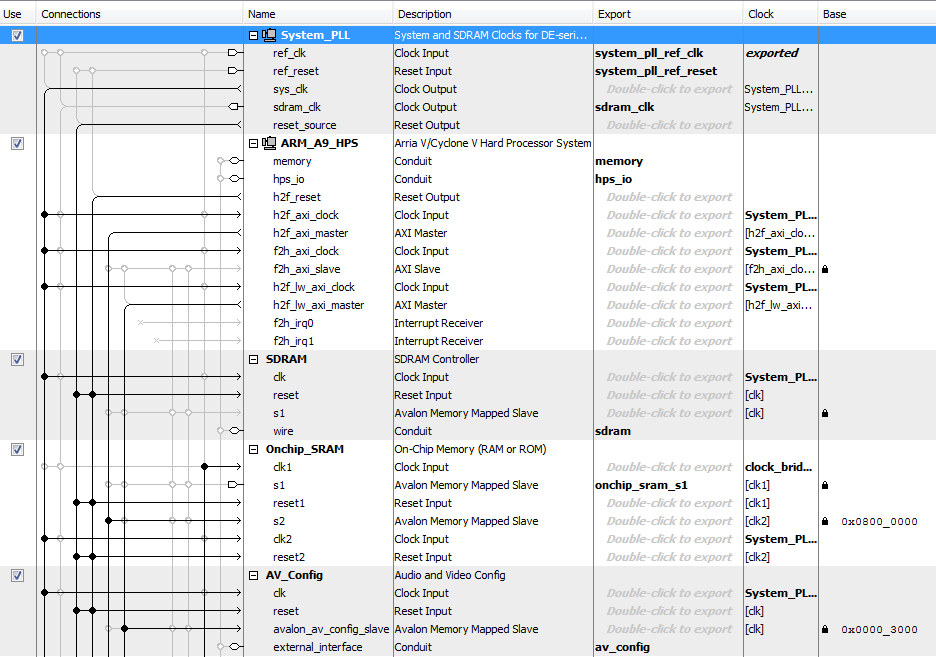

In [10]:
Image(filename = PATH + "Capture.png", width=800, height=800)

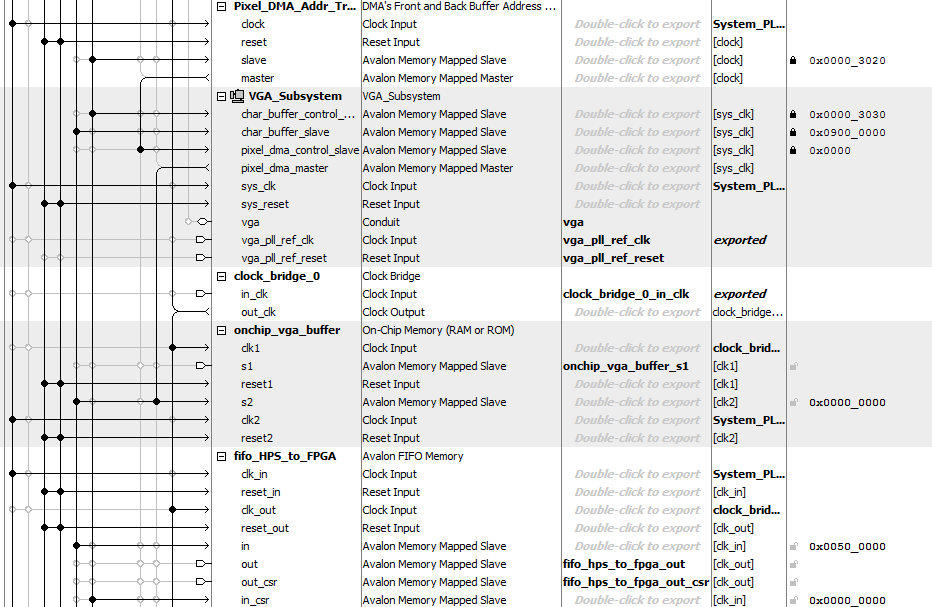

In [11]:
Image(filename = PATH + "Capture2.png", width=800, height=800)

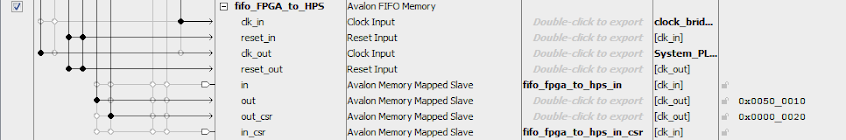

In [12]:
Image(filename = PATH + "unnamed.png", width=800, height=800)

### Establishing Ethernet Connection between RPi and HPS

#### 1. Setup the FPGA

Setup the FPGA as usual, with its ethernet plugged into a switch.

#### 2. Setup the RPi 

Setup the Raspberry Pi, plugging its ethernet into the same network switch.

#### 3. RTL-SDR

On the raspberry pi, install all necessary software for interfacing with the RTL-SDR radio dongle, as explained here: http://drwxr.org/2017/04/setting-up-rtl-sdr-on-raspberry-pi-3/. From this website:

1. Run **sudo apt-get install gnuradio**
2. Run **gnuradio-companion**, verify that the companion opens
3. Run **sudo apt-get install rtl-sdr gr-osmosdr**
4. Plug in the dongle
5. Run **lsusb**, make sure the dongle appears
6. Run **rtl_test**, make sure test passes

#### 4. Raspberry Pi IP Address

1. Run **ifconfig**
2. Find IP address of Pi, as shown below.

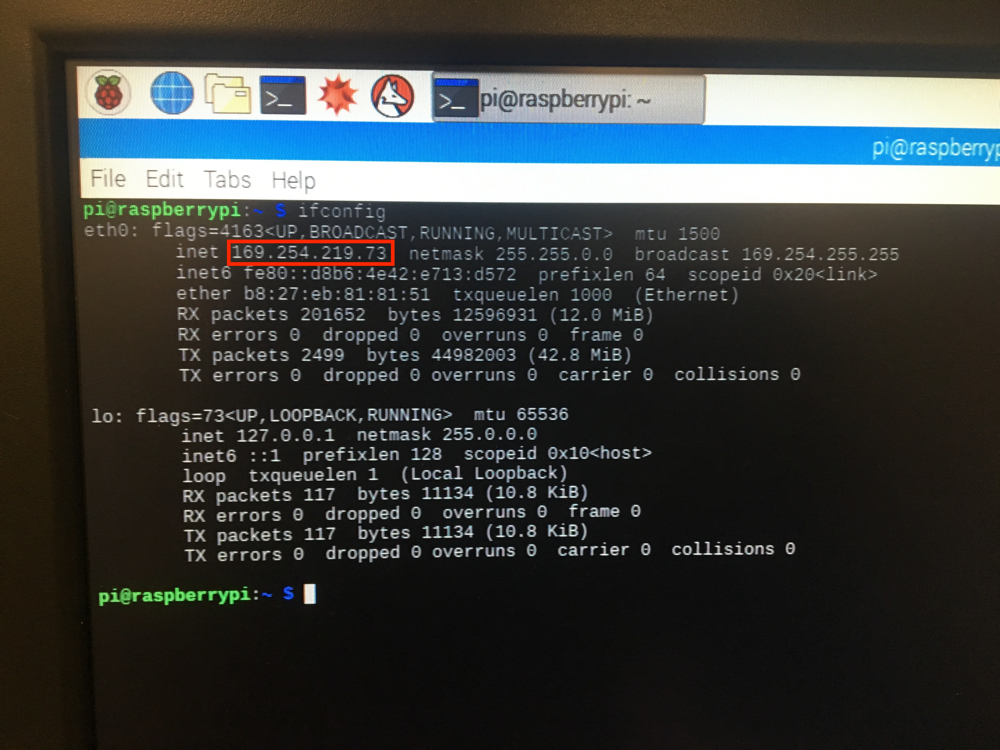

In [4]:
Image(filename = PATH + "ip.png", width=800, height=800)

#### 5. Start RTL TCP

 On the Pi, run **rtl_tcp -a 169.254.219.73 -p 1234**

#### 6. Receive TCP

On the ARM, run **nc 169.254.219.73 1234**